In [ ]:
import pandas as pd
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
!pip install pandas geopandas folium

In [ ]:
crime_data = pd.read_csv("Crimes_-_2022.csv")
# iterating the columns
for col in crime_data.columns:
    print(col)

ID
Case Number
Date
Block
IUCR
Primary Type
Description
Location Description
Arrest
Domestic
Beat
District
Ward
Community Area
FBI Code
X Coordinate
Y Coordinate
Year
Updated On
Latitude
Longitude
Location


In [ ]:
map = pd.read_csv("Crimes_-_Map.csv")
# iterating the columns
for col in map.columns:
    print(col)

CASE#
DATE  OF OCCURRENCE
BLOCK
 IUCR
 PRIMARY DESCRIPTION
 SECONDARY DESCRIPTION
 LOCATION DESCRIPTION
ARREST
DOMESTIC
BEAT
WARD
FBI CD
X COORDINATE
Y COORDINATE
LATITUDE
LONGITUDE
LOCATION


In [ ]:
zip = pd.read_csv("Zip_Codes.csv")
# iterating the columns
for col in zip.columns:
    print(col)

the_geom
OBJECTID
ZIP
SHAPE_AREA
SHAPE_LEN


# Crime hotspots in Chicago 2020-2022

---


In [ ]:
import pandas as pd
import folium

# Load crime data
crime_data = pd.read_csv('Crimes_-_Map.csv')

# Convert the 'DATE OF OCCURRENCE' column to datetime with the correct format
crime_data['DATE  OF OCCURRENCE'] = pd.to_datetime(crime_data['DATE  OF OCCURRENCE'], format='%m/%d/%Y %I:%M:%S %p')

# Filter data for the years 2020 to 2022
crime_data = crime_data[(crime_data['DATE  OF OCCURRENCE'].dt.year >= 2020) & (crime_data['DATE  OF OCCURRENCE'].dt.year <= 2022)]

# Create a map centered at the mean coordinates of the crime data
center_lat, center_lon = crime_data['LATITUDE'].mean(), crime_data['LONGITUDE'].mean()
crime_map = folium.Map(location=[center_lat, center_lon], zoom_start=12)

# Define grid cell size
grid_size = 0.01  # Degrees

# Create grid cells
crime_data['lat_bin'] = (crime_data['LATITUDE'] // grid_size) * grid_size
crime_data['lon_bin'] = (crime_data['LONGITUDE'] // grid_size) * grid_size

# Group by grid cells and count occurrences
crime_counts = crime_data.groupby(['lat_bin', 'lon_bin']).size().reset_index(name='CrimeCount')

# Add circles to represent crime density
for index, row in crime_counts.iterrows():
    folium.CircleMarker(
        location=[row['lat_bin'], row['lon_bin']],
        radius=row['CrimeCount'] / 12,
        color='red',
        fill=True,
        fill_color='red',
        fill_opacity=0.6,
        popup=f"Crime Count: {row['CrimeCount']}",
    ).add_to(crime_map)

# Display the map
crime_map

<ipython-input-5-bbee926b44c4>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crime_data['lat_bin'] = (crime_data['LATITUDE'] // grid_size) * grid_size
<ipython-input-5-bbee926b44c4>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crime_data['lon_bin'] = (crime_data['LONGITUDE'] // grid_size) * grid_size


In [ ]:
map = pd.read_csv("Chicago_Population_Counts_20231107.csv")
# iterating the columns
for col in map.columns:
    print(col)

Geography Type
Year
Geography
Population - Total
Population - Age 0-17
Population - Age 18-29
Population - Age 30-39
Population - Age 40-49
Population - Age 50-59
Population - Age 60-69
Population - Age 70-79
Population - Age 80+
Population - Age 0-4
Population - Age 5-11
Population - Age 12-17
Population - Age 5+
Population - Age 18+
Population - Age 65+
Population - Female
Population - Male
Population - Latinx
Population - Asian Non-Latinx
Population - Black Non-Latinx
Population - White Non-Latinx
Population - Other Race Non-Latinx
Record ID


In [ ]:
map.head()

,Geography Type,Year,Geography,Population - Total,Population - Age 0-17,Population - Age 18-29,Population - Age 30-39,Population - Age 40-49,Population - Age 50-59,Population - Age 60-69,...,Population - Age 18+,Population - Age 65+,Population - Female,Population - Male,Population - Latinx,Population - Asian Non-Latinx,Population - Black Non-Latinx,Population - White Non-Latinx,Population - Other Race Non-Latinx,Record ID
0,Citywide,2018,Chicago,2705988,548999,552935,456321,336457,312965,262991,...,2156989,349712,1386113,1319875,776661,179841.0,784266.0,899980,119467.0,Citywide-Chicago-2018
1,ZIP Code,2018,60601,14675,820,4606,2792,2190,1333,1340,...,13855,2075,7484,7191,1274,NaN,NaN,9677,NaN,ZIP_Code-60601-2018
2,ZIP Code,2018,60602,1244,149,435,462,135,53,10,...,1095,5,551,693,81,NaN,NaN,788,NaN,ZIP_Code-60602-2018
3,ZIP Code,2018,60603,1174,56,561,101,97,197,97,...,1118,112,601,573,115,NaN,NaN,707,NaN,ZIP_Code-60603-2018
4,ZIP Code,2018,60604,782,38,303,104,51,101,130,...,744,93,413,369,34,NaN,NaN,479,NaN,ZIP_Code-60604-2018


In [ ]:
!pip install plotly

In [ ]:
import pandas as pd
import geopandas as gpd
import folium

In [ ]:
geojson_path = 'Boundaries - ZIP Codes.geojson'
zip_boundaries = gpd.read_file(geojson_path)
for col in zip_boundaries.columns:
    print(col)

objectid
shape_area
shape_len
zip
geometry


# Hypothesis: There is a correlation between the concentration of reported crimes and the demographic composition of the Black population in the southwest region of Chicago.

# Observations:
Spatial Overlap:

The visual analysis reveals a spatial overlap between the concentration of reported crimes and the distribution of the Black population, both prominently observed in the southwest region of Chicago.

Correlation Patterns:

This idea suggests that in the southwest area, where we see more reported crimes, there are also more Black people. If this turns out to be true, it could mean that there's a complicated mix of reasons, like money issues and how the community works, that play a role in both crime and where people live.

Potential Explanations:

Socio-Economic Factors:

Issues from the past that affect how much money people have, like not enough jobs or not enough resources, might be part of why we see more crime in the same area where there are more Black people.

Community Dynamics:

How the community behaves, the relationships between people, and the challenges they share could be part of why the Black population is concentrated in the same place as reported crimes.

Policy Implications:

If we can understand this connection better, it can help create policies that focus on preventing crime and addressing the specific needs of these communities. This way, we can take a more holistic approach to improving the well-being of the entire community.

Importance:

This idea is interesting because it looks into the possible link between where crimes happen and the Black population in one specific area. By studying these patterns, we can get a deeper understanding of what factors, like money problems or community dynamics, might be influencing crime rates. This knowledge can guide policymakers and community leaders in creating effective strategies to tackle the root causes of crime in the southwest region of Chicago.

Remember, it's crucial to remember that just because two things seem connected doesn't mean one causes the other. More research and thinking about other factors are needed for a full understanding of what's going on.

In [ ]:
# Load demographic data
demographic_data = pd.read_csv('Chicago_Population_Counts_20231107.csv')

# Filter demographic data for years up to 2022
demographic_data = demographic_data[demographic_data['Year'] <= 2022]

# Load GeoJSON file for Chicago ZIP code boundaries
geojson_path = 'Boundaries - ZIP Codes.geojson'
zip_boundaries = gpd.read_file(geojson_path)

# Merge demographic data with ZIP code boundary data
merged_data = pd.merge(zip_boundaries, demographic_data, left_on='zip', right_on='Geography')

# Create a folium map centered around Chicago
m = folium.Map(location=[41.8781, -87.6298], zoom_start=10)

# Add choropleth layer
folium.Choropleth(
    geo_data=merged_data,
    name='choropleth',
    data=merged_data,
    columns=['zip', 'Population - Black Non-Latinx'],
    key_on='feature.properties.zip',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Population - Black Non-Latinx',
).add_to(m)

# Display the map
m


# **Hypothesis**: There is a positive correlation between the population of 0-17 years old and the crime rates in specific areas of Chicago

This hypothesis is interesting because it explores potential connections between the demographic structure of a neighborhood (specifically, the presence of a younger population) and the prevalence of reported crimes. Several criminological theories suggest that youth population density may influence crime rates due to factors such as peer influence, socio-economic conditions, and community resources. Investigating this hypothesis can contribute to a better understanding of the social dynamics influencing crime patterns in urban areas.

The visualizations reveal an intriguing spatial pattern in Chicago, particularly in the southwest region. The concentration of reported crimes appears to align with both a high density of the Black population and a significant population of individuals aged 0-17.

# **Observations**:
Spatial Concentration of Crime:

The heat map of crime rates highlights a concentrated area in the southwest, indicating that this region experiences a higher density of reported crimes compared to other parts of the city.

Coexistence with Black Population:

The southwest region, where crime is notably concentrated, corresponds with a significant concentration of the Black population. This observation suggests a potential correlation between the demographic composition of the area and crime rates.

Youth Population Density:

Furthermore, the southwest region also exhibits a higher density of individuals aged 0-17. The coexistence of a youthful population with elevated crime rates raises questions about the socio-economic factors, community resources, and potential influences contributing to this pattern.

In [ ]:
# Load demographic data
demographic_data = pd.read_csv('Chicago_Population_Counts_20231107.csv')

# Filter demographic data for years up to 2022
demographic_data = demographic_data[demographic_data['Year'] <= 2022]

# Load GeoJSON file for Chicago ZIP code boundaries
geojson_path = 'Boundaries - ZIP Codes.geojson'
zip_boundaries = gpd.read_file(geojson_path)

# Merge demographic data with ZIP code boundary data
merged_data = pd.merge(zip_boundaries, demographic_data, left_on='zip', right_on='Geography')

# Create a folium map centered around Chicago
m = folium.Map(location=[41.8781, -87.6298], zoom_start=10)

# Add choropleth layer
folium.Choropleth(
    geo_data=merged_data,
    name='choropleth',
    data=merged_data,
    columns=['zip', 'Population - Age 0-17'],
    key_on='feature.properties.zip',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Population - Age 0-17',
).add_to(m)

# Display the map
m


In [ ]:
pip install tabulate

In [ ]:
import folium
from folium.plugins import HeatMap
from IPython.display import display

# Load crime data
crime_data = pd.read_csv('Crimes_-_Map.csv')

# Convert 'DATE OF OCCURRENCE' column to datetime
crime_data['DATE  OF OCCURRENCE'] = pd.to_datetime(crime_data['DATE  OF OCCURRENCE'], errors='coerce')

# Filter data for the years 2020 to 2022
crime_data_filtered = crime_data[(crime_data['DATE  OF OCCURRENCE'].dt.year >= 2020) & (crime_data['DATE  OF OCCURRENCE'].dt.year <= 2022)]

In [ ]:
crime_counts = crime_data_filtered['BEAT'].value_counts().reset_index()
crime_counts.columns = ['BEAT', 'Crime Count']

# Sort the DataFrame by Crime Count
sorted_beats = crime_counts.sort_values(by='Crime Count', ascending=False)

# Display the table
table = tabulate(sorted_beats[['BEAT', 'Crime Count']], headers=['Police Beat', 'Crime Count'], tablefmt='pretty')
print(table)

+-----+-------------+-------------+
|     | Police Beat | Crime Count |
+-----+-------------+-------------+
|  0  |    1834     |     520     |
|  1  |    1214     |     348     |
|  2  |     123     |     340     |
|  3  |     421     |     332     |
|  4  |     511     |     323     |
|  5  |     222     |     309     |
|  6  |     624     |     297     |
|  7  |    1831     |     291     |
|  8  |     423     |     284     |
|  9  |     632     |     273     |
| 10  |     631     |     268     |
| 11  |     414     |     265     |
| 12  |    2413     |     252     |
| 13  |    1232     |     250     |
| 14  |     823     |     247     |
| 15  |     111     |     246     |
| 16  |     623     |     240     |
| 18  |     331     |     238     |
| 17  |    1133     |     238     |
| 19  |     815     |     234     |
| 20  |    1121     |     234     |
| 21  |    1224     |     231     |
| 22  |     612     |     229     |
| 23  |    2512     |     229     |
| 24  |    1112     |     22

In [ ]:
import plotly.express as px

# Create a treemap using plotly
fig = px.treemap(sorted_beats,
                 path=['BEAT'],
                 values='Crime Count',
                 title='Crime Counts by Police Beat',
                 color='Crime Count',
                 color_continuous_scale='viridis')

# Show the plot
fig.show()

In [ ]:
# Load crime data
crime_data = pd.read_csv('Crimes_-_2022.csv')

# Convert the 'Date' column to datetime
crime_data['Date'] = pd.to_datetime(crime_data['Date'])

# Filter data for the years 2020 to 2022
crime_data_filtered = crime_data[(crime_data['Date'].dt.year >= 2020) & (crime_data['Date'].dt.year <= 2022)]
crime_data_f = crime_data_filtered
for col in crime_data_filtered.columns:
    print(col)

ID
Case Number
Date
Block
IUCR
Primary Type
Description
Location Description
Arrest
Domestic
Beat
District
Ward
Community Area
FBI Code
X Coordinate
Y Coordinate
Year
Updated On
Latitude
Longitude
Location


In [ ]:
for col in crime_data_f.columns:
    print(col)

ID
Case Number
Date
Block
IUCR
Primary Type
Description
Location Description
Arrest
Domestic
Beat
District
Ward
Community Area
FBI Code
X Coordinate
Y Coordinate
Year
Updated On
Latitude
Longitude
Location


In [ ]:

# Extract unique values from the "Primary Type" column
unique_primary_types = crime_data_f['Primary Type'].unique()

# Print the unique values
for primary_type in unique_primary_types:
    print(primary_type)


SEX OFFENSE
OTHER OFFENSE
WEAPONS VIOLATION
THEFT
BATTERY
CRIMINAL SEXUAL ASSAULT
ROBBERY
BURGLARY
ARSON
OFFENSE INVOLVING CHILDREN
DECEPTIVE PRACTICE
ASSAULT
MOTOR VEHICLE THEFT
NARCOTICS
CRIMINAL DAMAGE
INTIMIDATION
STALKING
CRIMINAL TRESPASS
HOMICIDE
INTERFERENCE WITH PUBLIC OFFICER
OBSCENITY
PUBLIC PEACE VIOLATION
PROSTITUTION
LIQUOR LAW VIOLATION
KIDNAPPING
CONCEALED CARRY LICENSE VIOLATION
HUMAN TRAFFICKING
OTHER NARCOTIC VIOLATION
GAMBLING
NON-CRIMINAL
PUBLIC INDECENCY


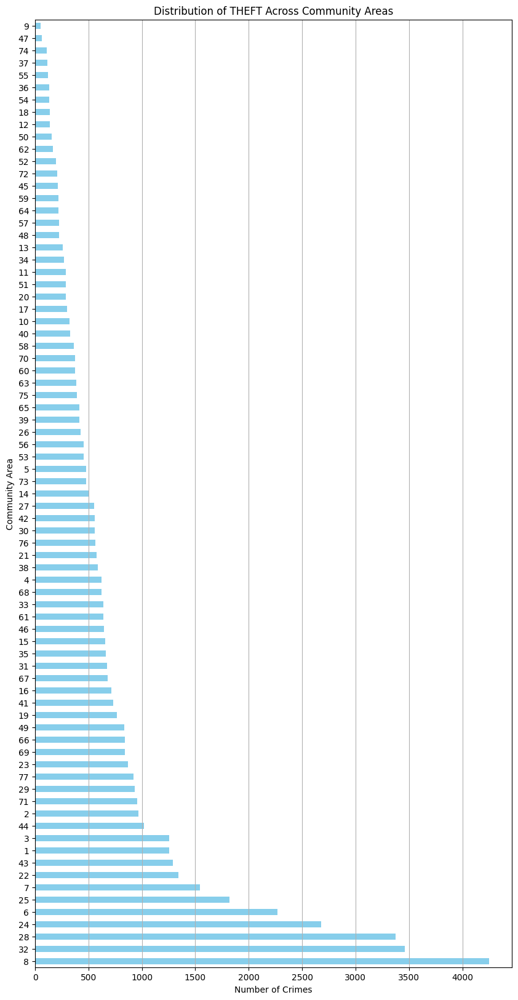

In [46]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you're interested in a specific crime type (e.g., 'THEFT')
crime_type_of_interest = 'THEFT'

# Filter data for the specific crime type
filtered_data = crime_data_f[crime_data_f['Primary Type'] == crime_type_of_interest]

# Group by Community Area and count the number of occurrences
crime_counts_by_area = filtered_data['Community Area'].value_counts()

# Create a horizontal bar chart
plt.figure(figsize=(10, 20))
crime_counts_by_area.plot(kind='barh', color='skyblue')
plt.title(f'Distribution of {crime_type_of_interest} Across Community Areas')
plt.xlabel('Number of Crimes')
plt.ylabel('Community Area')
plt.grid(axis='x')
plt.show()


In [ ]:
# Import necessary libraries
import pandas as pd
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

# Assuming 'crime_data_filtered' is your DataFrame with the crime data
# Select relevant features for anomaly detection
selected_features = ['Latitude', 'Longitude', 'Date', 'Arrest', 'Domestic', 'Beat', 'District', 'Ward', 'Community Area', 'FBI Code']

crime_data_filtered = crime_data_f[selected_features]

# Convert 'Date' to datetime type
crime_data_filtered['Date'] = pd.to_datetime(crime_data_filtered['Date'])

# Feature engineering: Extract day of the week and hour of the day from 'Date'
crime_data_filtered['DayOfWeek'] = crime_data_filtered['Date'].dt.dayofweek
crime_data_filtered['HourOfDay'] = crime_data_filtered['Date'].dt.hour

# Drop the original 'Date' column
crime_data_filtered = crime_data_filtered.drop(columns=['Date'])

# Handle missing values
crime_data_filtered = crime_data_filtered.dropna()

# Convert categorical columns to numerical using one-hot encoding
crime_data_filtered = pd.get_dummies(crime_data_filtered)

# Standardize numerical features
scaler = StandardScaler()
crime_data_scaled = scaler.fit_transform(crime_data_filtered)

# Assuming you have a target variable (e.g., 'Arrest') for evaluation
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(crime_data_scaled, crime_data_filtered['Arrest'], test_size=0.2, random_state=42)

# Train the Isolation Forest model
model = IsolationForest(contamination=0.01, random_state=42)
model.fit(X_train)

# Predict anomalies on the test set
y_pred = model.predict(X_test)

# Convert predictions to 1 for inliers and -1 for outliers
y_pred[y_pred == 1] = 0  # Inliers
y_pred[y_pred == -1] = 1  # Outliers

# Evaluate the model
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


<ipython-input-45-59dfffd37379>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-45-59dfffd37379>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-45-59dfffd37379>:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[[40995    15]
 [ 5022   459]]
              precision    recall  f1-score   support

       False       0.89      1.00      0.94     41010
        True       0.97      0.08      0.15      5481

    accuracy                           0.89     46491
   macro avg       0.93      0.54      0.55     46491
weighted avg       0.90      0.89      0.85     46491

